In [31]:
# Load packages

# For the Hermite polynomial basis
using DynamicPolynomials: @polyvar
using MultivariateBases: maxdegree_basis, PhysicistsHermiteBasis, ProbabilistsHermiteBasis

# For finding the centers of the RBF basis
using Clustering

# Some standard linear algebra stuff
using LinearAlgebra
using Trapz  

# For visualization
using Printf
using LaTeXStrings
using CairoMakie
dark_latexfonts = merge(theme_black(), theme_latexfonts())
set_theme!(dark_latexfonts)

## System specification

Let's consider the *Duffing Oscillator*
$$ \ddot{x}(t) = - \delta \dot{x}(t) -  x(t) \left( \beta + \alpha x^2(t) \right), $$
with $\alpha=1$, $\beta=-1$ and $\delta=0.5$.

Introducing $x_1 = x$ and $x_2 = \dot{x}$, we get
$$ \frac{d}{dt} \begin{pmatrix} x_1(t) \\ x_2(t) \end{pmatrix} = \begin{pmatrix} x_2(t) \\ -\delta x_2(t) -\beta x_1(t) - \alpha x_1^3(t) \end{pmatrix}. $$

In [32]:
n = 2;           # space dimension

# right-hand side of the Duffing system
function rhs(x)
    ɑ, β, δ = 1, -1, 0.5
    xdot = [x[2]; - δ * x[2] - β * x[1] - ɑ * x[1]^3];
    return xdot
end

# position of the three fixed points (0,0) / (-1,0) / (1,0)
X_fixed = [-1 0 1; 0 0 0];

# Runge-Kutta integrator to create the time series
function rk4(x0, dt, m, nLag=1)
    x = zeros(n, nLag * m + 1)
    x[:, 1] = x0[:, 1]
    for k = 1 : nLag * m
        k1 = rhs(x[:, k])
        k2 = rhs(x[:, k] + 0.5 * dt * k1)
        k3 = rhs(x[:, k] + 0.5 * dt * k2)
        k4 = rhs(x[:, k] + dt * k3)
        x[:, k + 1] = x[:, k] + dt / 6 * (k1 + 2 * (k2 + k3) + k4)
    end
    return x[:, 1:nLag:end]
end;

## Visualize a couple of trajectories

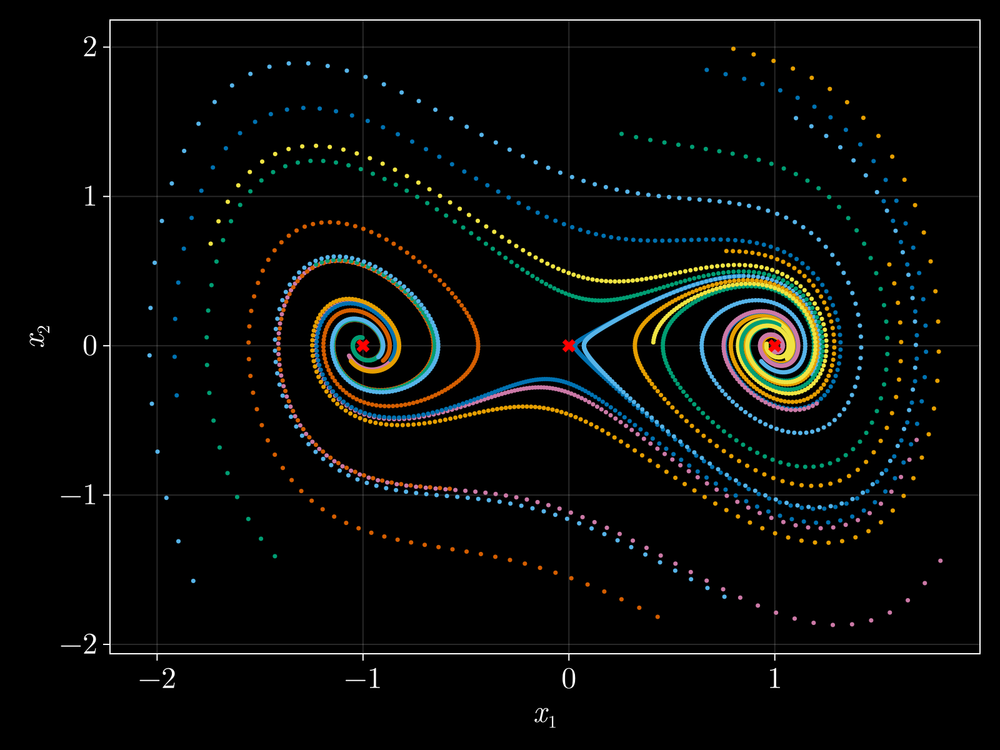

In [33]:
m_traj_vis = 20 # how many trajectories to compute

dt = 0.01       # time step for integrator
nLag_vis = 5    # return out only every 5th entry for the dataset
m_vis = 200     # how many samples per trajectory

# simulate trajectories with random initial conditions
X_vis = zeros(n, m_traj_vis * m_vis)
for i in 1 : m_traj_vis
    x0 = -2 * ones(2,1) .+ 4 * rand(2,1);
    Xi = rk4(x0, dt, m_vis, nLag_vis);
    X_vis[:, (i-1) * m_vis + 1 : i * m_vis] = Xi[:, 1 : m_vis]
end

# Plotting
fig = Figure(fontsize = 24, size = (800, 600), backgroundcolor = "black")

# trajectories
ax = Axis(fig[1, 1], backgroundcolor = "black", 
    xlabel=L"x_1", ylabel=L"x_2")
for i in 1 : m_traj_vis
    sc = scatter!(ax, X_vis[1, (i-1) * m_vis + 1 : i * m_vis], X_vis[2, (i-1) * m_vis + 1 : i * m_vis], markersize = 5)
end

# fixed points
sc = scatter!(ax, X_fixed[1, :], X_fixed[2, :], marker = :xcross, color = :red, markersize = 15)
fig

## Data collection

In [34]:
# same as for the visualization before, 
# but more and shorter trajectories
m_traj = 2000

dt = 0.01
nLag = 25
m = 10

# Y: X mapped forward by one time step of size (dt * nLag)
X = zeros(n, m_traj * m)
Y = zeros(n, m_traj * m)
for i in 1 : m_traj
    x0 = -2 * ones(2,1) .+ 4 * rand(2,1);
    Xi = rk4(x0, dt, m, nLag);
    X[:, (i-1) * m + 1 : i * m] = Xi[:, 1 : m]
    Y[:, (i-1) * m + 1 : i * m] = Xi[:, 2 : m + 1]
end

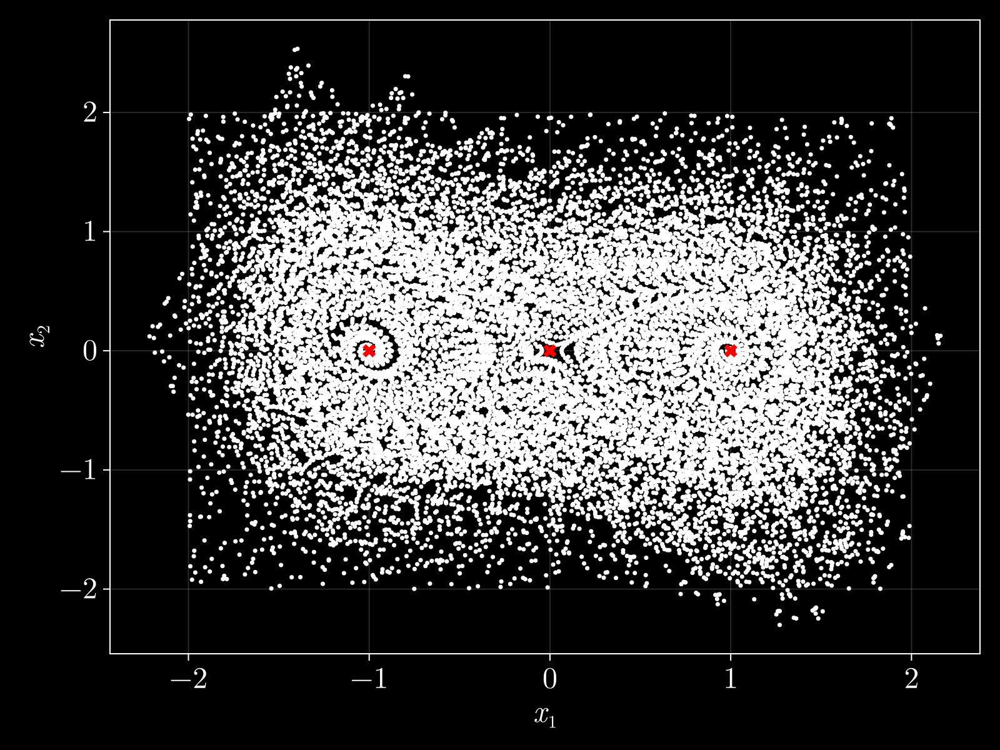

In [35]:
# Visualize the dataset
fig = Figure(fontsize = 24, size = (800, 600), backgroundcolor = "black")
ax = Axis(fig[1, 1], backgroundcolor = "black", 
    xlabel=L"x_1", ylabel=L"x_2")
sc = scatter!(ax, X[1, :], X[2, :], color = :white, markersize = 5)
sc = scatter!(ax, X_fixed[1, :], X_fixed[2, :], marker = :xcross, color = :red, markersize = 15)
fig

## Koopman operator for prediction

### Set up the dictionary
Options:
- Hermite polynomials
- Thin plate splines (Radial Basis Functions)

In [36]:
# this is the code for the Hermite polynomial dictionary

# number if dictionary entries
function getDimPsi(n, max_deg)
    dim_Psi = 1
    for i in 1 : max_deg
        dim_Psi += factorial(n + i - 1) / (factorial(i) * factorial(n - 1))
    end
    return Int(dim_Psi)
end;

# create hermite basis of given degree and n-dimensional inputs
function HermiteBasis(n, max_deg)
    @polyvar pv[1:n]
    basis = maxdegree_basis(ProbabilistsHermiteBasis, pv, max_deg)
    B = reverse(range(2, n + 1))
    return basis, getDimPsi(n, max_deg), B
end;

In [37]:
max_deg = 7;     # maximal degree of hermite basis

# build dictionary function Psi using the basis
function Psi_Hermite(X)

    n = size(X)[1]
    m = size(X)[2]

    basis, dimPsi, P = HermiteBasis(n, max_deg);

    PsiX = zeros((dimPsi, m))
    for k in 1 : m
        PsiX[:, k] = [b(X[:, k]) for b in basis]
    end
    return PsiX
end;

### Visualize the behavior of the Hermite basis in 1D

In [38]:
# interval of interest
ex_nx = 201
ex_x = zeros((1, ex_nx));
ex_x[1, :] = range(-1, 1, ex_nx);

# example function to study
ex_fx = sin.(2*pi*ex_x) .+ 0.5 .* cos.(pi*ex_x) .+ 0.5;

# L2 inner product, norm and projection
L2_ip(f, g) = trapz(vec(ex_x), vec(f) .* vec(g));
L2_norm(f) = sqrt(L2_ip(f, f));
L2_proj(f, g) = L2_ip(f, g) * g / L2_norm(g);

# lift the trajectory to the individual basis elements
ex_PsiX = Psi_Hermite(ex_x)

# Gram-schmidt orthonormalization
for i in 1 : max_deg + 1
    for j in 1 : i - 1
        ex_PsiX[i, :] -= L2_proj(ex_PsiX[i, :], ex_PsiX[j, :])
    end
    ex_PsiX[i, :] /= L2_norm(ex_PsiX[i, :]);
end

# project the example function onto the basis vectors
ex_a = zeros((max_deg + 1, 1))
for i in 1 : max_deg + 1
    ex_a[i, 1] = L2_ip(ex_fx, ex_PsiX[i, :])
end;

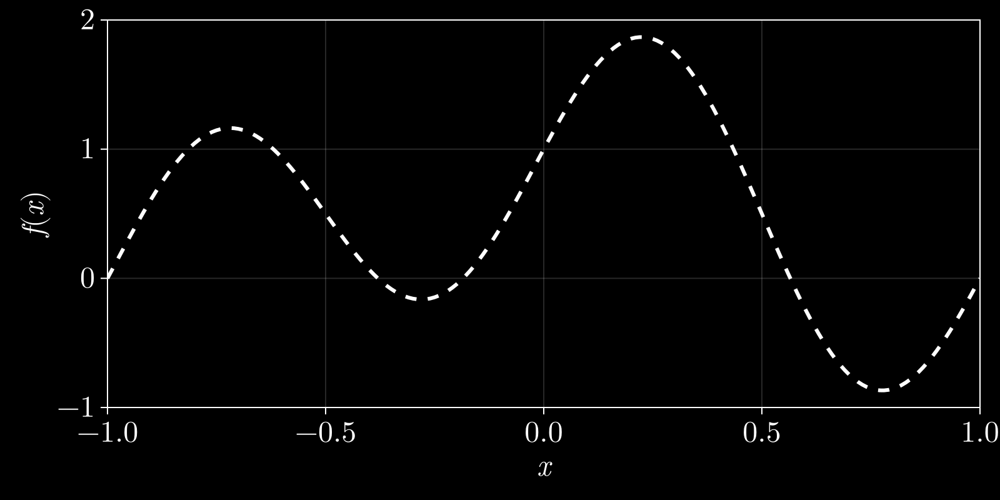

In [39]:
# Visualize the function of interest
fig = Figure(fontsize = 24, size = (800, 400), backgroundcolor = "black")
ax = Axis(fig[1, 1], xlabel = L"x", ylabel = L"f(x)", limits=((-1,1), (-1, 2)))
lines!(ax, vec(ex_x), vec(ex_fx), color=:white, linestyle=:dash, linewidth=3, label=L"f(x)")
fig

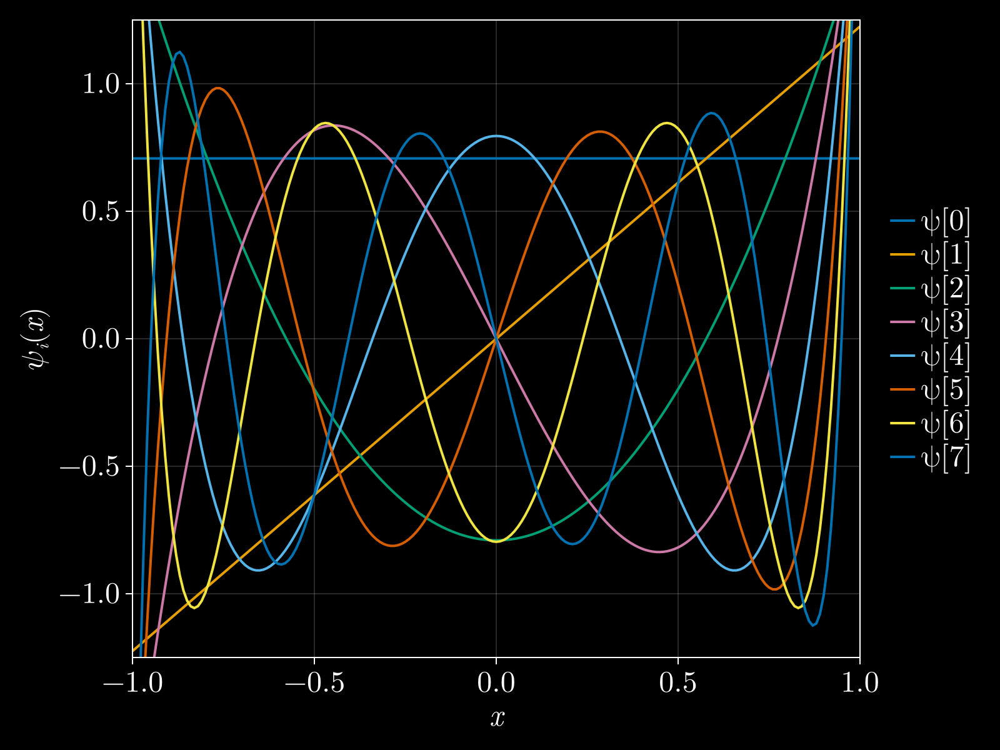

In [40]:
# Visualize the Hermite basis
fig = Figure(fontsize = 24, size = (800, 600), backgroundcolor = "black")
ax = Axis(fig[1, 1], xlabel = L"x", ylabel = L"ψ_i(x)", limits=((-1,1), (-1.25, 1.25)))
for i in 1 : max_deg + 1
    lines!(ax, vec(ex_x), vec(ex_PsiX[i, :]), linewidth=2, label=@sprintf("ψ[%d]", i-1))
end
fig[1, 2] = Legend(fig, ax, framevisible = false)
fig

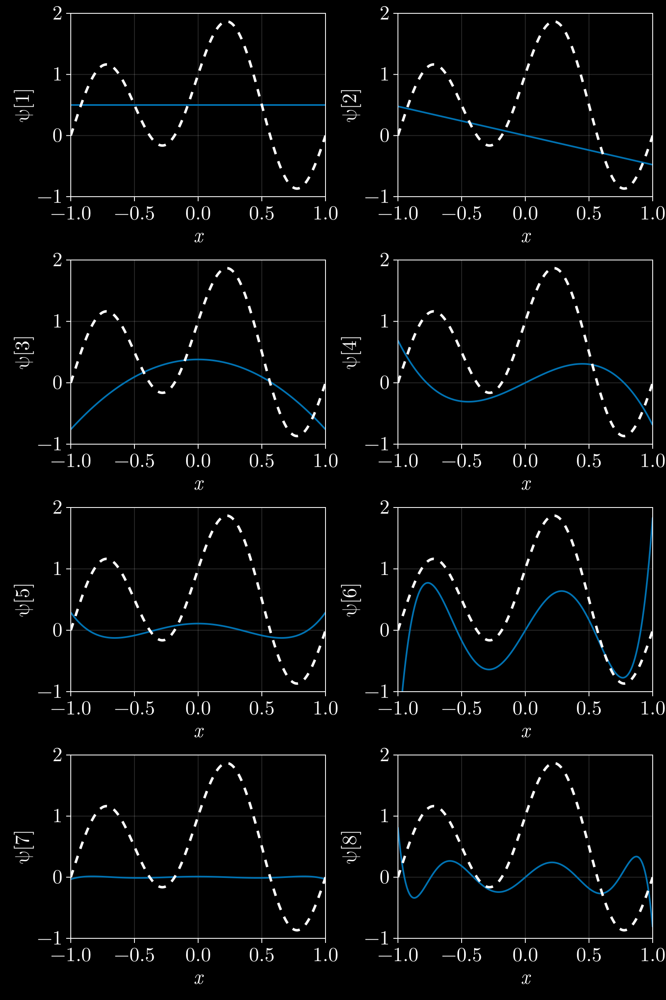

In [41]:
# Visualize the Hermite basis projections
fig = Figure(fontsize = 24, size = (800, 1200), backgroundcolor = "black")
for i in 1 : 4
    for j in 1 : 2
        k = 2 * (i-1) + j
        ax = Axis(fig[i, j], xlabel = L"x", ylabel = @sprintf("ψ[%d]", k), limits=((-1,1), (-1, 2)))
        lines!(ax, vec(ex_x), ex_a[k, 1] .* vec(ex_PsiX[k, :]), linewidth=2)
        lines!(ax, vec(ex_x), vec(ex_fx), color=:white, linestyle=:dash, linewidth=3)
    end
end
fig

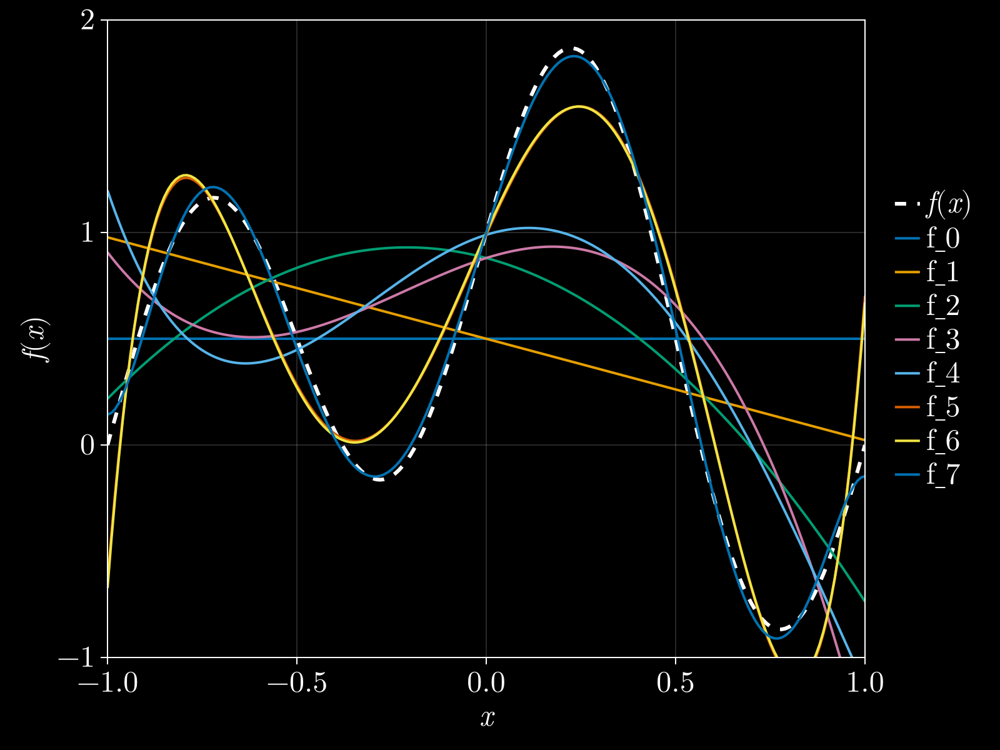

In [42]:
# Visualize reconstructed function
fig = Figure(fontsize = 24, size = (800, 600), backgroundcolor = "black")
ax = Axis(fig[1, 1], xlabel = L"x", ylabel = L"f(x)", limits=((-1,1), (-1, 2)))
lines!(ax, vec(ex_x), vec(ex_fx), color=:white, linestyle=:dash, linewidth=3, label=L"f(x)")
for i in 1 : max_deg + 1
    lines!(ax, vec(ex_x), vec(ex_a[1:i, :]' * ex_PsiX[1:i, :]), linewidth=2, label=@sprintf("f_%d", i-1))
end
fig[1, 2] = Legend(fig, ax, framevisible = false)
fig

### EDMD

In [43]:
# Koopman operator approximation via EDMD
ΨX = Psi_Hermite(X)
ΨY = Psi_Hermite(Y)
K = inv(ΨX * ΨX') * ΨX * ΨY';

# Projection operator
nPsi = getDimPsi(n, max_deg);
B = zeros((n,nPsi));
B[1, 3] = 1.0;
B[2, 2] = 1.0;

### prediction accuracy

In [44]:
# comparison of some trajectories
m_traj_test = 1000
m_test = 20

# create trajectories from random initial conditions
X_test = zeros((n, m_test + 1, m_traj_test))
for i in 1 : m_traj_test
    x0 = -2 * ones(2,1) .+ 4 * rand(2,1);
    X_test[:, :, i] = rk4(x0, dt, m_test, nLag);
end

# Test the prediction accuracy via Koopman
ΨX_test = zeros((nPsi, m_test + 1, m_traj_test))
XK_test = zeros((n, m_test + 1, m_traj_test))
x0 = zeros((2,1))
for i in 1 : m_traj_test
    x0[:, 1] = X_test[:, 1, i]

    # Koopman predictor
    ΨX_test[:, 1, i] = Psi_Hermite(x0)[:, 1]
    for j in 1 : m_test
        ΨX_test[:, j + 1, i] = K' * ΨX_test[:, j, i]
    end

    # projection onto the state space
    XK_test[:, :, i] = B * ΨX_test[:, :, i]
end

# calculate RMS
ɛ = zeros((1, m_test + 1))
for i in 1 : m_traj_test
    ɛ += sqrt.(ones((1,2)) * (XK_test[:, :, i] .- X_test[:, :, i]).^2)
end
ɛ /= m_traj_test;

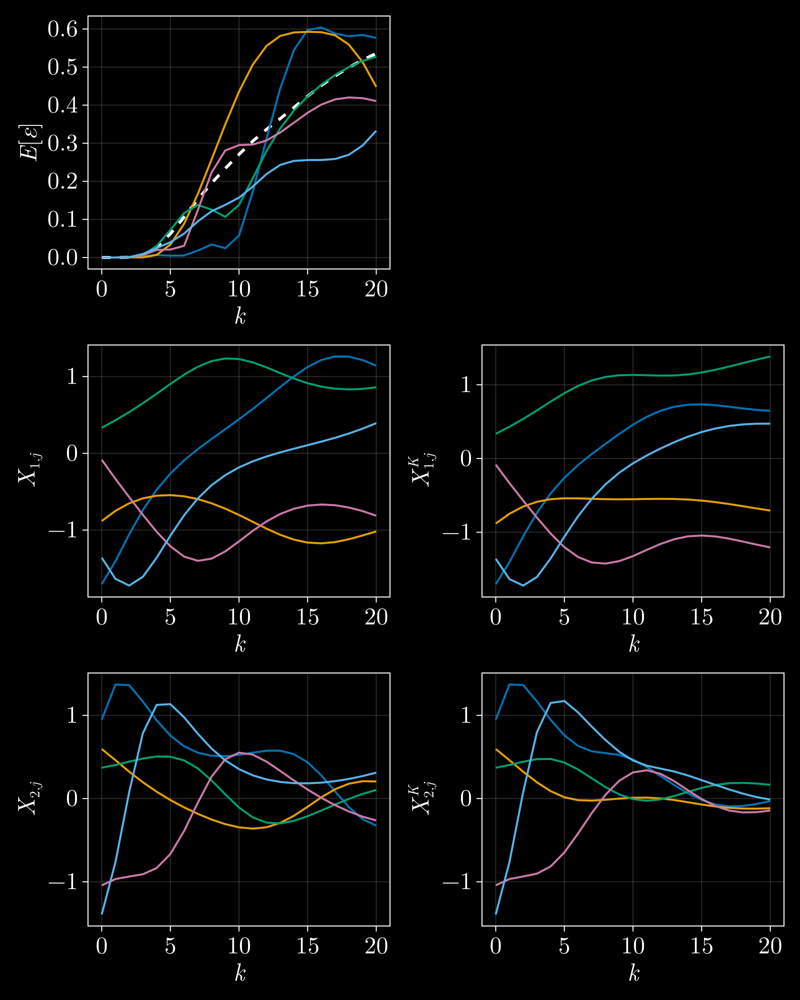

In [45]:
# Plot Error and some trajectories
f = Figure(fontsize = 24, size = (800, 1000), backgroundcolor = "black")

ax = Axis(f[1, 1], xlabel = L"k", ylabel = L"E[ɛ]")
lines!(ax, range(0,m_test), vec(ɛ), color=:white, linewidth=3, linestyle=:dash)

#ax = Axis(f[1, 1], xlabel = L"k", ylabel = L"ɛ_j")
for i in 1 : 5
    lines!(ax, range(0,m_test), vec(sqrt.(ones((1,2)) * (XK_test[:, :, i] .- X_test[:, :, i]).^2)), linewidth=2)
end

ax = Axis(f[2, 1], xlabel = L"k", ylabel = L"X_{1,j}")
for i in 1 : 5
    lines!(ax, range(0,m_test), X_test[1,:,i], linewidth=2)
end

ax = Axis(f[2, 2], xlabel = L"k", ylabel = L"X^K_{1,j}")
for i in 1 : 5
    lines!(ax, range(0,m_test), XK_test[1,:,i], linewidth=2)
end

ax = Axis(f[3, 1], xlabel = L"k", ylabel = L"X_{2,j}")
for i in 1 : 5
    lines!(ax, range(0,m_test), X_test[2,:,i], linewidth=2)
end

ax = Axis(f[3, 2], xlabel = L"k", ylabel = L"X^K_{2,j}")
for i in 1 : 5
    lines!(ax, range(0,m_test), XK_test[2,:,i], linewidth=2)
end
f

## Eigendecomposition of the Koopman operator

Now with RBF dictionary

In [46]:
# This is the code for the RBF dictionary
using Clustering: kmeans

# number of RBF centers to use
nRBF = 1000

# place the centers using kMeans
R = kmeans(X, nRBF; maxiter=2000) #, display=:iter)
c = R.centers # get the cluster centers

# build Psi function using thin plate RBF
function Psi_RBF(X)
    m = size(X)[2]
    PsiX = ones((nRBF + 1, m))
    for k in 1 : nRBF
        # distance to k'th center
        r = sqrt.(ones(1, n) * (X - c[:, k] * ones(m)').^2) .+ 1e-12
        
        # thin plate rule
        PsiX[k + 1, :] = r.^2 .* log.(r)
    end
    return PsiX
end;

dimPsi = nRBF + 1;

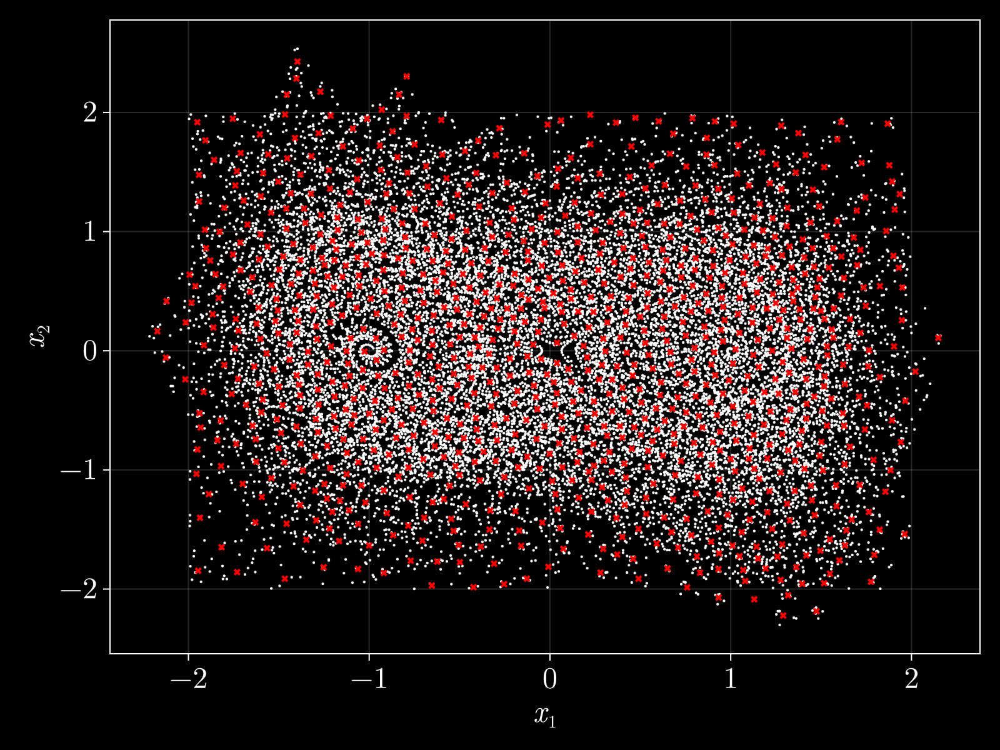

In [47]:
# Show the centers for the RBFs
fig = Figure(fontsize = 24, size = (800, 600), backgroundcolor = "black")
ax = Axis(fig[1, 1], backgroundcolor = "black", 
    xlabel=L"x_1", ylabel=L"x_2")
sc = scatter!(ax, X[1, :], X[2, :], color = :white, markersize = 3)
sc = scatter!(ax, c[1, :], c[2, :], marker = :xcross, color = :red, markersize = 8)
fig

## Calculate the Koopman operator

In [48]:
# Lift the data
ΨX = Psi_RBF(X)
ΨY = Psi_RBF(Y)

# Compute K
K = inv(ΨX * ΨX') * ΨX * ΨY'

# Eigendecomposition
μ = eigvals(K);
Ξ = eigvecs(K);

# just some sorting
i_sort = reverse(sortperm(real.(μ), by=abs));
μ = μ[i_sort];
Ξ = Ξ[:, i_sort];

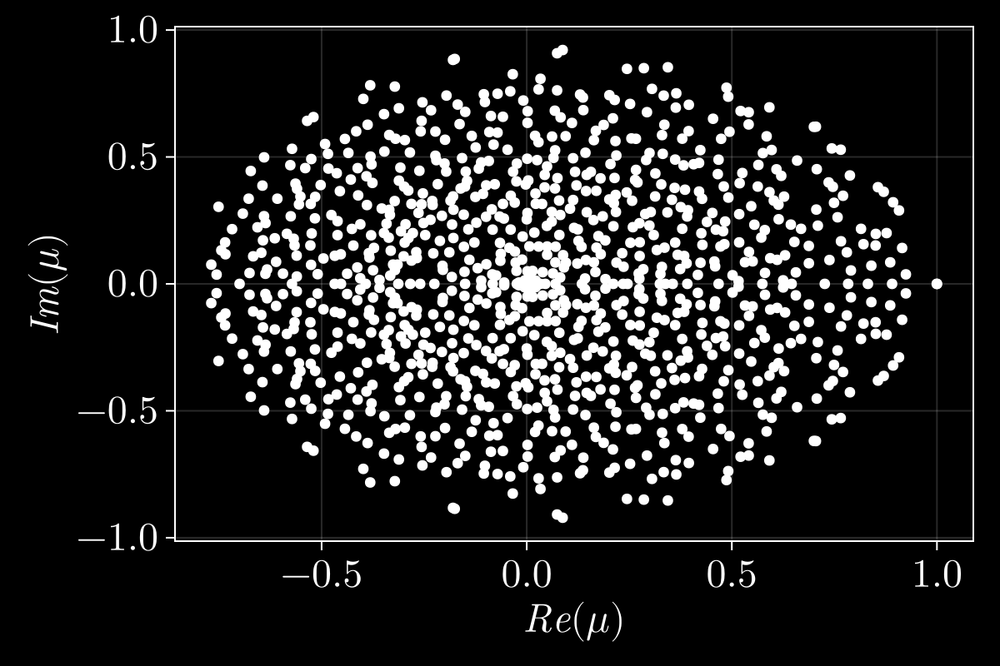

In [49]:
# Visualize the spectrum
fig = Figure(fontsize = 24, size = (600, 400), backgroundcolor = "black")
ax = Axis(fig[1, 1], xlabel = L"Re(\mu)", ylabel = L"Im(\mu)")
scatter!(ax, real(μ), imag(μ), color="white")
fig

### Compute the Koopman eigenfunctions and evaluate on an equidistant grid

In [50]:
# create a meshgrid of 101 x 101 points in the 2D state space
ngrid = 101
xgrid = range(-2,2,ngrid)
Xgrid2 = (xgrid' .* ones(ngrid))';
Xgrid1 = (ones(ngrid)' .* xgrid)';

# maximum number of eigenfunctions to compute
φmax = 20

# evaluate the Koopman eigenfunctions on the meshgrid
φ = zeros(ngrid, ngrid, min(dimPsi, φmax));
xij = zeros((2,1))
for k in 1 : min(dimPsi, φmax)
    for i in 1 : ngrid
        # vectorized calculation the goes through the grid line by line
        φ[i, :, k] = real.(Ξ[:, k]') * Psi_RBF([Xgrid1[i, :]'; Xgrid2[i, :]']);
    end;
end;

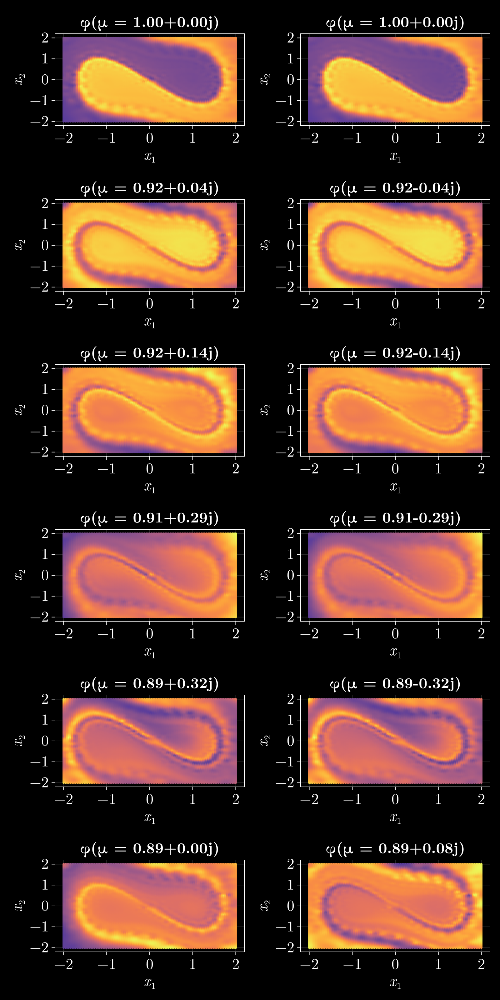

In [51]:
# Function to normalize a vector to [0, 1]
# This is only used for plotting
function normalizeVector(x, lb = 0.35)
    dx = maximum(x) - minimum(x);
    return ((((x .- minimum(x)) ./ dx) .+ lb) ./ (1 + lb))
end;

# Plotting
fig = Figure(fontsize = 24, size = (800, 1600), backgroundcolor = "black")
for i in 1 : 6
    for j in 1 : 2
        k = (i-1)*2 + j
        ax = Axis(fig[i, j], backgroundcolor = "black", 
            title=@sprintf("φ(μ = %.2f%+.2fj)", real(μ[k]), imag(μ[k])), 
            xlabel=L"x_1", ylabel=L"x_2")
        sc = scatter!(ax, vec(Xgrid1), vec(Xgrid2), color = vec(normalizeVector(φ[:, :, k])), 
            colorrange = (0,1), markersize = 5, 
            colormap = :thermal)
    end
end

fig

In [52]:
# Separate leading eigenfunction into two basins of attraction

# split according to the first EF
i_split = 1

# separation by intermediate value 0.5
# this should be approximately the man due to symmetry of the system
i_gt_0 = findall(>(0.5), normalizeVector(vec(φ[:, :, i_split])));
i_lt_0 = findall(<(0.5), normalizeVector(vec(φ[:, :, i_split])));

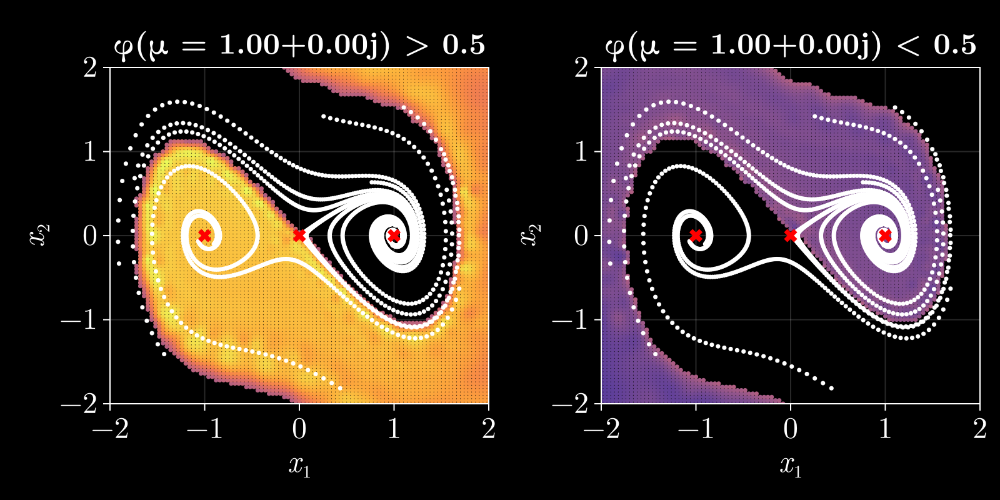

In [53]:
# Visualize the separation into basis of attraction via the 1st EF
fig = Figure(fontsize = 24, size = (800, 400), backgroundcolor = "black")

ax = Axis(fig[1, 1], backgroundcolor = "black", limits=((-2,2), (-2, 2)), 
    title=@sprintf("φ(μ = %.2f%+.2fj) > 0.5", real(μ[i_split]), imag(μ[i_split])), 
    xlabel=L"x_1", ylabel=L"x_2")
sc = scatter!(ax, vec(Xgrid1)[i_gt_0], vec(Xgrid2)[i_gt_0], color = vec(normalizeVector(φ[:, :, i_split]))[i_gt_0], 
    colorrange = (0,1), markersize = 5, 
    colormap = :thermal)
for i in 1 : Int(m_traj_vis/2)
    sc = scatter!(ax, X_vis[1, (i-1) * m_vis + 1 : i * m_vis], X_vis[2, (i-1) * m_vis + 1 : i * m_vis], 
    markersize = 5, color=:white)
end
sc = scatter!(ax, X_fixed[1, :], X_fixed[2, :], marker = :xcross, color = :red, markersize = 15)

ax2 = Axis(fig[1, 2], backgroundcolor = "black", limits=((-2,2), (-2, 2)), 
    title=@sprintf("φ(μ = %.2f%+.2fj) < 0.5", real(μ[i_split]), imag(μ[i_split])), 
    xlabel=L"x_1", ylabel=L"x_2")
sc = scatter!(ax2, vec(Xgrid1)[i_lt_0], vec(Xgrid2)[i_lt_0], color = vec(normalizeVector(φ[:, :, i_split]))[i_lt_0], 
    colorrange = (0,1), markersize = 5, 
    colormap = :thermal)
for i in 1 : Int(m_traj_vis/2)
    sc = scatter!(ax2, X_vis[1, (i-1) * m_vis + 1 : i * m_vis], X_vis[2, (i-1) * m_vis + 1 : i * m_vis], 
    markersize = 5, color=:white)
end
sc = scatter!(ax2, X_fixed[1, :], X_fixed[2, :], marker = :xcross, color = :red, markersize = 15)

fig

## Repeat Koopman calculation, but on subset of the domain

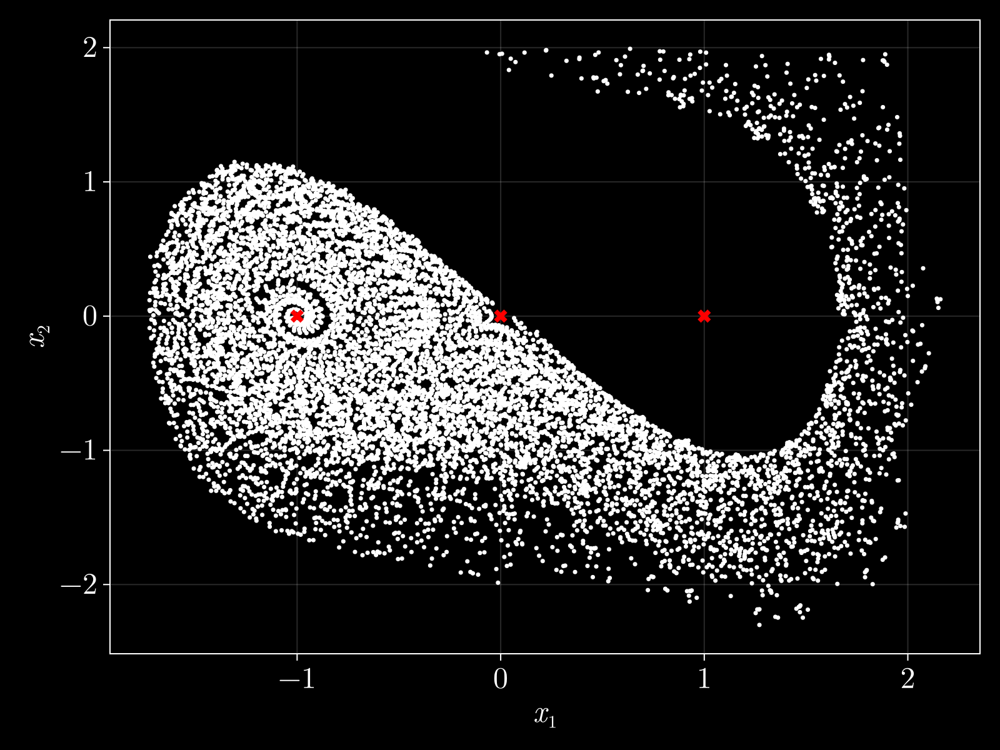

In [61]:
φX = real.(Ξ[:, i_split]') * Psi_RBF(X);
iX_gt_0 = findall(>(0.5), normalizeVector(φX[1,:]))
X2 = X[:, iX_gt_0];
Y2 = Y[:, iX_gt_0];

# Plotting
fig = Figure(fontsize = 24, size = (800, 600), backgroundcolor = "black")
ax = Axis(fig[1, 1], backgroundcolor = "black", 
    xlabel=L"x_1", ylabel=L"x_2")
sc = scatter!(ax, X2[1, :], X2[2, :], color = :white, markersize = 5)
sc = scatter!(ax, X_fixed[1, :], X_fixed[2, :], marker = :xcross, color = :red, markersize = 15)
fig

In [62]:
# take half of the previous RBF centers
nRBF2 = Int(nRBF/2);

# and place them again using kMeans on the selected data
R2 = kmeans(X2, nRBF2; maxiter=2000)
c2 = R2.centers # get the cluster centers

function Psi2(X_)
    m_ = size(X_)[2]
    PsiX = ones((nRBF2 + 1, m_))
    for k in 1 : nRBF2
        r = sqrt.(ones(1, n) * (X_ - c2[:, k] * ones(m_)').^2) .+ 1e-12
        PsiX[k + 1, :] = r.^2 .* log.(r)
    end
    return PsiX
end;

dimPsi2 = nRBF2 + 1;

In [63]:
# Koopman again
ΨX2 = Psi2(X2)
ΨY2 = Psi2(Y2)

K2 = inv(ΨX2 * ΨX2') * ΨX2 * ΨY2'

μ2 = eigvals(K2);
Ξ2 = eigvecs(K2);

i_sort = reverse(sortperm(real.(μ2), by=abs))

μ2 = μ2[i_sort]
Ξ2 = Ξ2[:, i_sort]

φX2 = (Ξ2[:, 1 : min(dimPsi2, φmax)]') * Psi2(X2);

### find eigenvalue closest to the eigenvalue of the linearization around the fixed point (-1, 0)

In [64]:
λDesired = -0.25 + 1.387im;
μDesired = exp(nLag * dt * λDesired)

Δμ = abs.(μ2 .- μDesired);
iDesired = (sortperm(Δμ, by=abs))[1];


In [65]:
μDesired
atan(imag(μDesired), real(μDesired))

0.34674999999999995

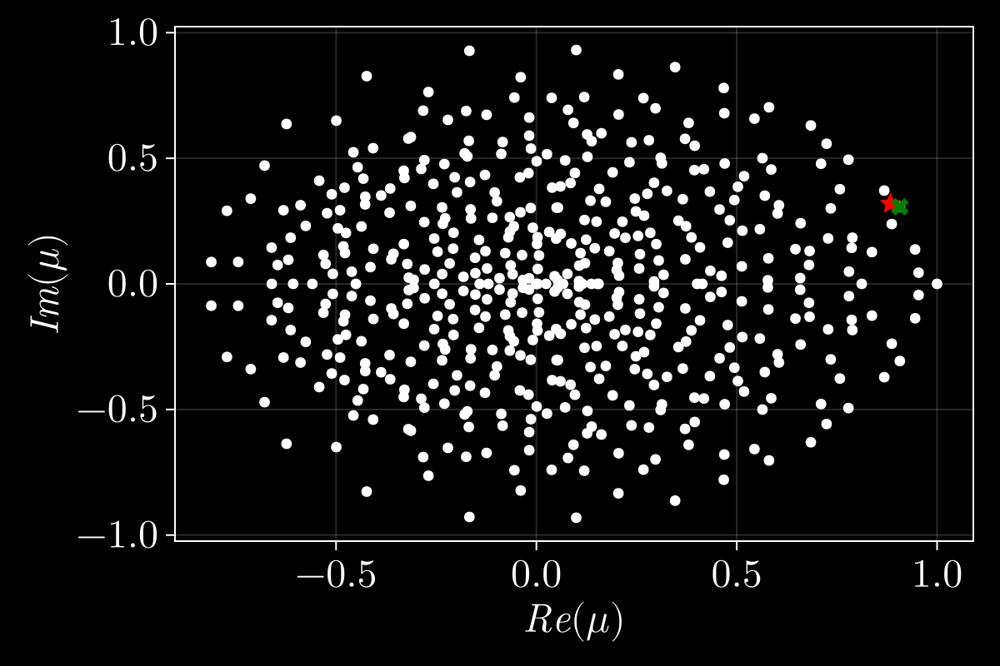

In [66]:
# Visualize the spectrum
fig = Figure(fontsize = 24, size = (600, 400), backgroundcolor = "black")
ax = Axis(fig[1, 1], xlabel = L"Re(\mu)", ylabel = L"Im(\mu)")
scatter!(ax, real(μ2), imag(μ2), color="white")
sc = scatter!(ax, real(μDesired), imag(μDesired), marker = :star5, color = :red, markersize = 15)
sc = scatter!(ax, real(μ2[iDesired]), imag(μ2[iDesired]), marker = :xcross, color = :green, markersize = 15)
fig

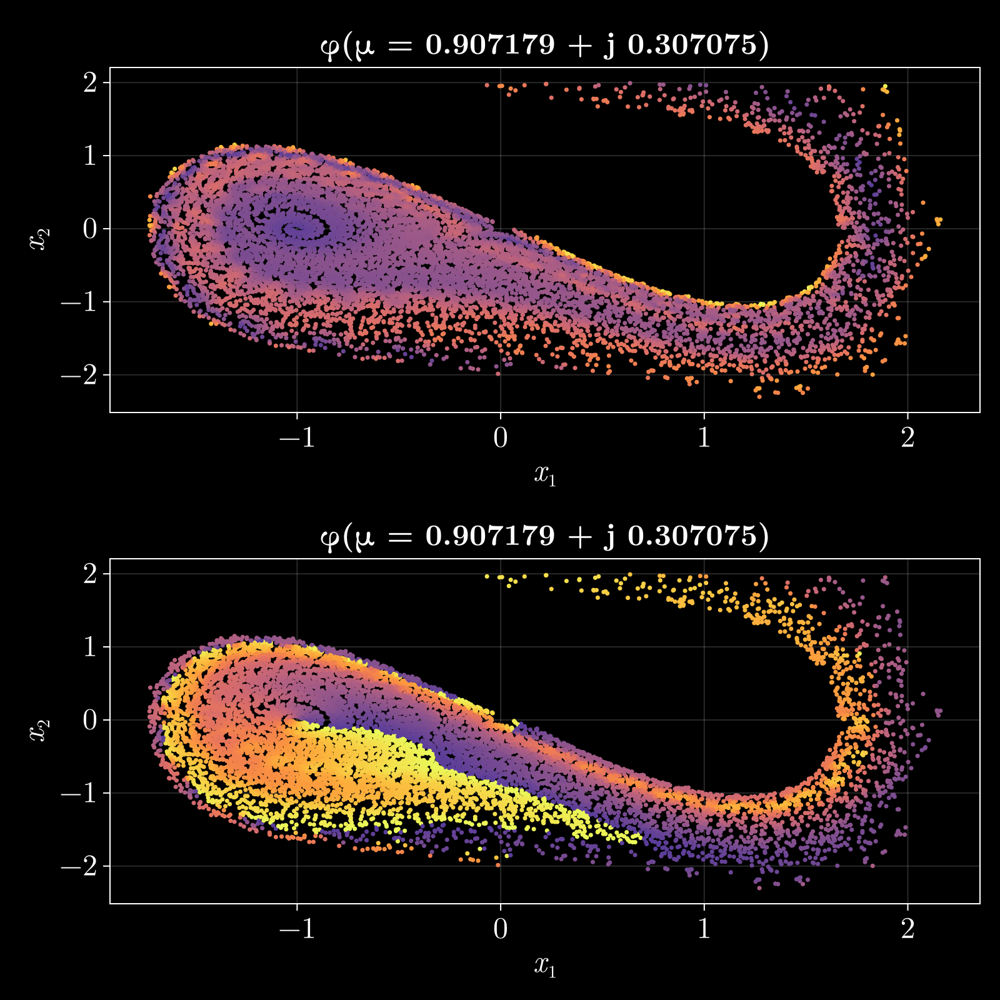

In [67]:
# Visualize the identified eigenfunction on the dataset
fig = Figure(fontsize = 24, size = (800, 800), backgroundcolor = "black")
ax = Axis(fig[1, 1], backgroundcolor = "black", 
    title=@sprintf("φ(μ = %f + j %f)", real(μ2[iDesired]), imag(μ2[iDesired])), 
    xlabel=L"x_1", ylabel=L"x_2")
sc = scatter!(ax, X2[1,:], X2[2,:], color = normalizeVector(real.(abs.(φX2[iDesired, :]))), 
    colorrange = (0,1), markersize = 5, 
    colormap = :thermal)

ax = Axis(fig[2, 1], backgroundcolor = "black", 
    title=@sprintf("φ(μ = %f + j %f)", real(μ2[iDesired]), imag(μ2[iDesired])), 
    xlabel=L"x_1", ylabel=L"x_2")
sc = scatter!(ax, X2[1,:], X2[2,:], color = normalizeVector(real.(atan.(imag.(φX2[iDesired, :]), real.(φX2[iDesired, :])))), 
    colorrange = (0,1), markersize = 5, 
    colormap = :thermal)

fig